# Extracting New Images from Various Datasets

In [1]:
%matplotlib inline
import json
import os
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
import cv2

## 1) Human Body Images - HBI

The images with the total joint number of 22 and upper is ideal for the dataset.

In [40]:
print("Total Images: %d" % (len(count[22])+len(count[23])+len(count[24])+len(count[25])))

Total Images: 11906


In [8]:
hbi_images = sorted(os.listdir('HBI_IMGS/'))
hbi_json = sorted(os.listdir('hbi_json/'))
hbi_rendered = sorted(os.listdir('hbi/'))

In [9]:
count = defaultdict(list)

for j in hbi_json:
    if len(json.load(open('hbi_json/' + j))['people']) != 0:
        joint_num = int(np.sum(np.array(json.load(open('hbi_json/' + j))['people'][0]['pose_keypoints_2d']) != 0)/3)
        count[joint_num].append(j)

In [12]:
keys = sorted(count.keys(), reverse=True)[:10]
print(keys)

[25, 24, 23, 22, 21, 20, 19, 18, 17, 16]


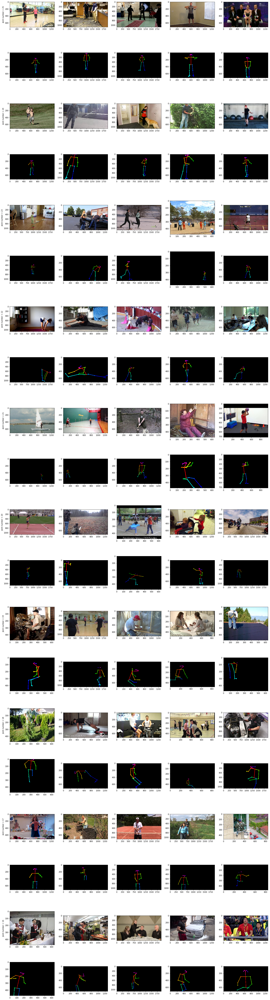

In [19]:
f, ax = plt.subplots(20, 5, figsize=(25,100))
r = 0

for j_num in keys:
    
    data = count[j_num][:5]
    
    ax[r,0].set_ylabel("Joint number = {}".format(j_num))
    
    for c in range(5):
        ax[r,c].imshow(
            cv2.cvtColor(
                cv2.imread('HBI_IMGS/'+data[c].replace('_keypoints.json', '.jpg')), cv2.COLOR_BGR2RGB
            )
        )
    
    for c in range(5):
        ax[r+1,c].imshow(
            cv2.cvtColor(
                cv2.imread('hbi/'+data[c].replace('keypoints.json', 'rendered.png')), cv2.COLOR_BGR2RGB
            )
        )
        
    r += 2

## 2) JPEG Images 

The images with the total joint number of 22 and upper is ideal for the dataset.

In [41]:
print("Total Images: %d" % (len(count_jpeg[22]) + len(count_jpeg[23])+len(count_jpeg[24])+len(count_jpeg[25])))

Total Images: 1516


In [23]:
jpeg_images = sorted(os.listdir('JPEGImages/'))
jpeg_json = sorted(os.listdir('jpeg_json/'))
jpeg_rendered = sorted(os.listdir('jpeg/'))

In [24]:
count_jpeg = defaultdict(list)

for j in jpeg_json:
    if len(json.load(open('jpeg_json/' + j))['people']) != 0:
        joint_num = int(np.sum(np.array(json.load(open('jpeg_json/' + j))['people'][0]['pose_keypoints_2d']) != 0)/3)
        count_jpeg[joint_num].append(j)

In [27]:
keys = sorted(count_jpeg.keys(), reverse=True)[:10]
print(keys)

[25, 24, 23, 22, 21, 20, 19, 18, 17, 16]


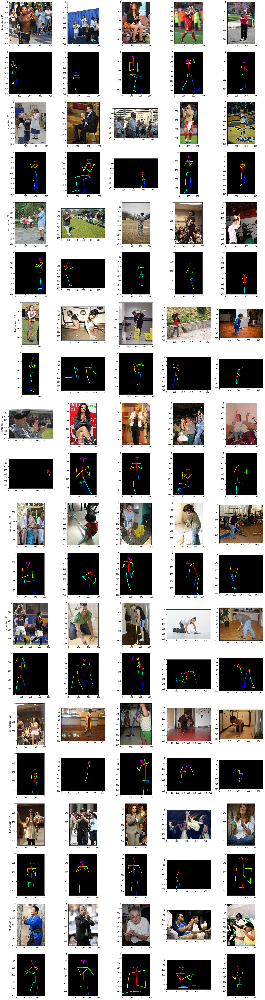

In [29]:
f, ax = plt.subplots(20, 5, figsize=(25,100))
r = 0

for j_num in keys:
    
    data = count_jpeg[j_num][:5]
    
    ax[r,0].set_ylabel("Joint number = {}".format(j_num))
    
    for c in range(5):
        ax[r,c].imshow(
            cv2.cvtColor(
                cv2.imread('JPEGImages/'+data[c].replace('_keypoints.json', '.jpg')), cv2.COLOR_BGR2RGB
            )
        )
    
    for c in range(5):
        ax[r+1,c].imshow(
            cv2.cvtColor(
                cv2.imread('jpeg/'+data[c].replace('keypoints.json', 'rendered.png')), cv2.COLOR_BGR2RGB
            )
        )
        
    r += 2

## 3) Move images to new dataset

In [53]:
import shutil

hbi_dataset = count[22]+count[23]+count[24]+count[25]
jpeg_dataset = count_jpeg[22]+count_jpeg[23]+count_jpeg[24]+count_jpeg[25]

print("HBI = %d" % len(hbi_dataset))
print("JPEG = %d" % len(jpeg_dataset))

HBI = 11906
JPEG = 1516


In [54]:
for f in hbi_dataset:
    source =  f.replace('_keypoints.json', '.jpg')
    shutil.move('HBI_IMGS/' + source, 'extended_dataset/' + source)

In [56]:
for f in jpeg_dataset:
    source =  f.replace('_keypoints.json', '.jpg')
    shutil.move('JPEGImages/' + source, 'extended_dataset/' + source)

In [70]:
for f in os.listdir('HMP_images/full_body/'):
    shutil.move('HMP_images/full_body/' + f, 'extended_dataset/' + f) 

In [74]:
print("Extended Dataset Size = %d" % len(os.listdir('extended_dataset/')))

Extended Dataset Size = 13580
